# ADOM - Weryfikacja Eksperymentów
**Temat 12:** Detekcja obiektów – Faster R-CNN (2015)  
**Zespół:** Mantiuk, Mackiewicz, Kołyska, Rydzewski

Szybki przegląd wykonanych eksperymentów:
1. Baseline (Pretrained)
2. Wpływ parametrów: Confidence Threshold i NMS
3. Analiza False Positives (Trudne przypadki)
4. Szybkość: Faster R-CNN vs YOLOv8
5. Rozszerzenie GPU: Fine-tuning (Wczytanie wcześniej nauczonych wag)

In [2]:
import os
import time
import torch
import torchvision
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
from torchvision.io import read_image
from torchvision.utils import draw_bounding_boxes
import urllib.request

try:
    from ultralytics import YOLO
except ImportError:
    import subprocess
    subprocess.run(["pip", "install", "ultralytics", "pycocotools", "-q"])
    from ultralytics import YOLO

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Używane urządzenie: {device}")

os.makedirs("data", exist_ok=True)
urls = {
    "data/sample_dog.jpg": "https://raw.githubusercontent.com/pytorch/vision/main/gallery/assets/dog2.jpg",
    "data/hard_case.jpg": "https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg"
}

for path, url in urls.items():
    if not os.path.exists(path):
        req = urllib.request.Request(url, headers={'User-Agent': 'Mozilla/5.0'})
        with urllib.request.urlopen(req) as response, open(path, 'wb') as out_file:
            out_file.write(response.read())

img = read_image("data/sample_dog.jpg")
img_float = F.convert_image_dtype(img, dtype=torch.float).to(device)

weights = torchvision.models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT

Używane urządzenie: cpu


## Eksperyment 1 & 2: Baseline, Confidence Threshold i NMS
Testujemy model z różnymi progami `score_thresh` oraz `nms_thresh`.

--- 1. BASELINE (Optymalne wartości) ---


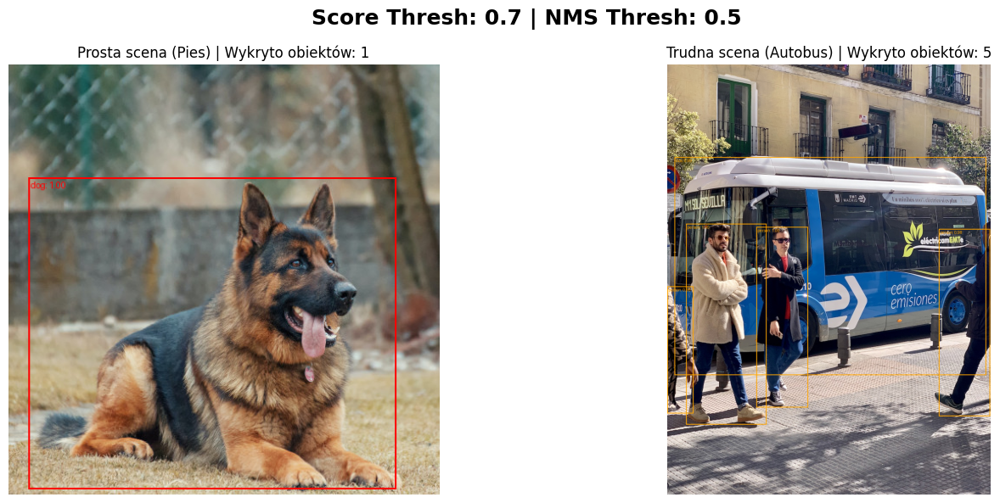

--- 2. NISKIE PROGI I WYSOKI NMS (Setki nakładających się ramek i False Positives z tła) ---


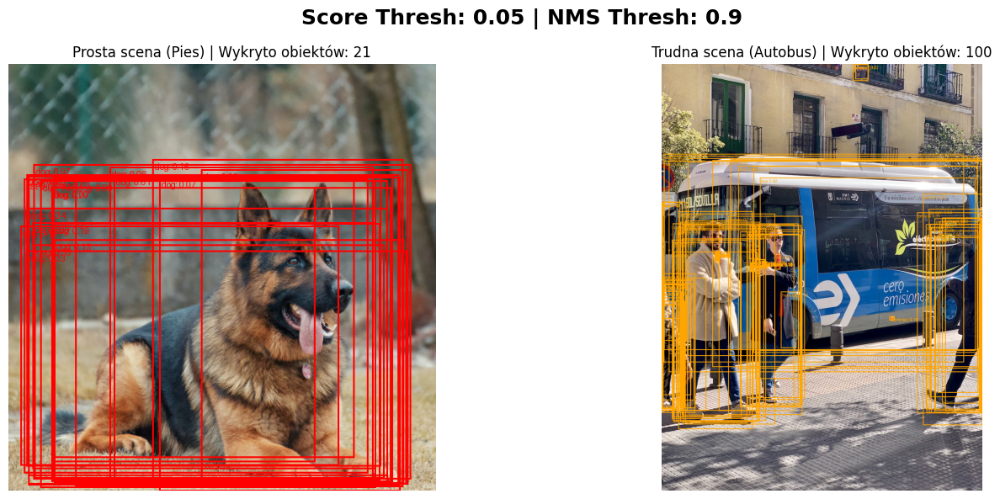

--- 3. WYSOKIE PROGI I NISKI NMS (Tylko najpewniejsze detekcje, agresywne usuwanie duplikatów) ---


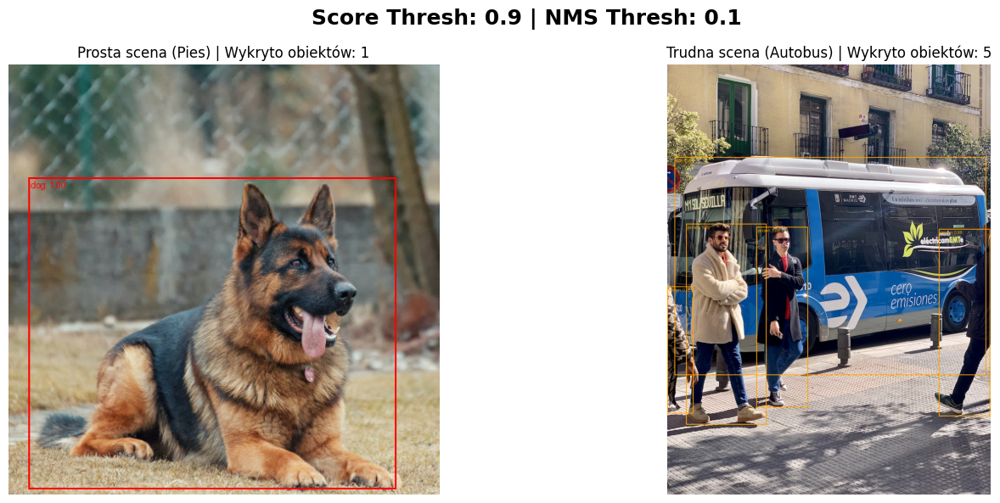

--- 4. NISKIE PROGI I NISKI NMS (Brak nakładania, ale pełno śmieci z tła) ---


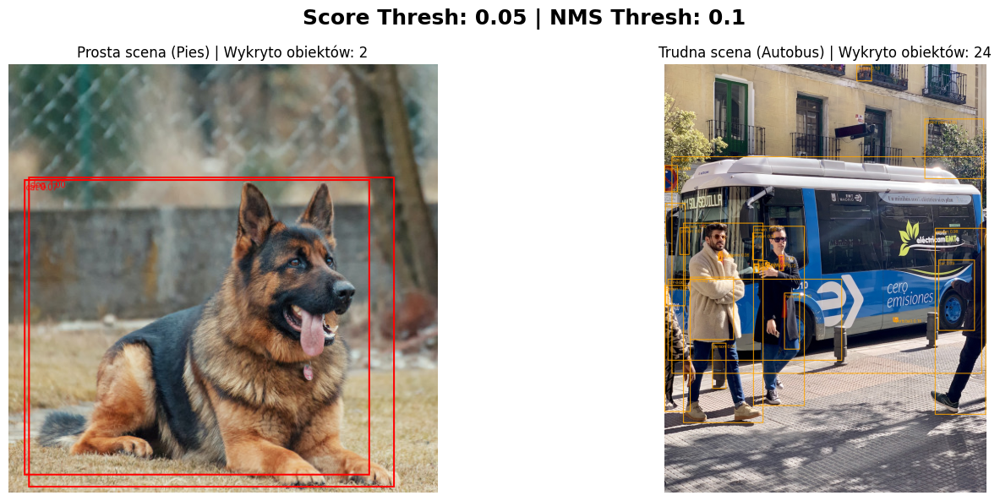

--- 5. WYSOKIE PROGI I WYSOKI NMS (Pewne detekcje, ale model może pokazywać duplikaty dla tego samego obiektu) ---


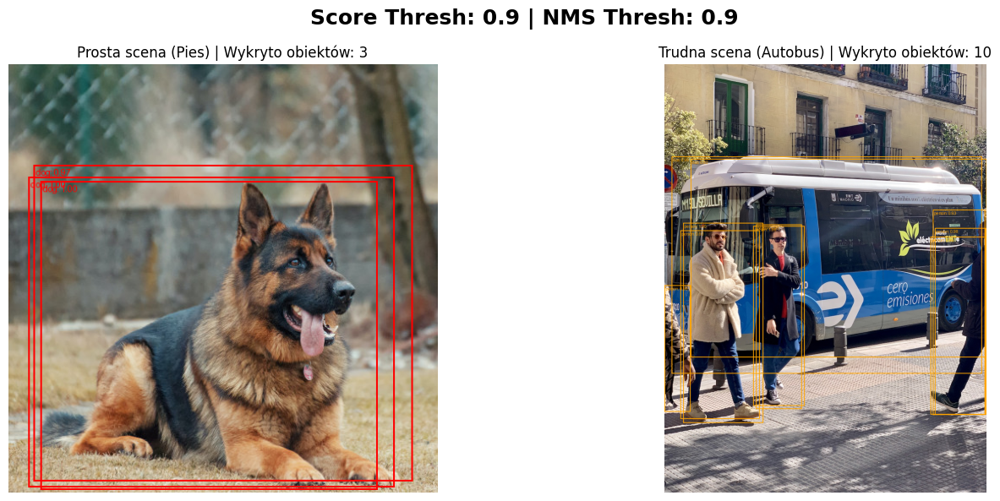

In [3]:
img_hard = read_image("data/hard_case.jpg")
img_hard_float = F.convert_image_dtype(img_hard, dtype=torch.float).to(device)

def run_threshold_experiment(score_thresh, nms_thresh):
    # Inicjalizacja modelu z zadanymi parametrami
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
        weights=weights,
        box_score_thresh=score_thresh,
        box_nms_thresh=nms_thresh
    ).to(device).eval()
    
    # predykcja dla prostego zdjęcia
    with torch.no_grad():
        preds_dog = model([img_float])[0]
        
    boxes_dog = preds_dog["boxes"].cpu()
    scores_dog = preds_dog["scores"].cpu()
    labels_dog = [f"{weights.meta['categories'][l]}: {s:.2f}" for l, s in zip(preds_dog["labels"].cpu(), scores_dog)]
    drawn_dog = draw_bounding_boxes(img, boxes_dog, labels_dog, colors="red", width=2)
    
    # predykcja dla trudnego zdjęcia
    with torch.no_grad():
        preds_bus = model([img_hard_float])[0]
        
    boxes_bus = preds_bus["boxes"].cpu()
    scores_bus = preds_bus["scores"].cpu()
    labels_bus = [f"{weights.meta['categories'][l]}: {s:.2f}" for l, s in zip(preds_bus["labels"].cpu(), scores_bus)]
    drawn_bus = draw_bounding_boxes(img_hard, boxes_bus, labels_bus, colors="orange", width=2)
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle(f"Score Thresh: {score_thresh} | NMS Thresh: {nms_thresh}", fontsize=18, fontweight='bold')
    
    axes[0].imshow(drawn_dog.permute(1, 2, 0))
    axes[0].set_title(f"Prosta scena (Pies) | Wykryto obiektów: {len(boxes_dog)}")
    axes[0].axis('off')
    
    axes[1].imshow(drawn_bus.permute(1, 2, 0))
    axes[1].set_title(f"Trudna scena (Autobus) | Wykryto obiektów: {len(boxes_bus)}")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

print("--- 1. BASELINE (Optymalne wartości) ---")
run_threshold_experiment(score_thresh=0.7, nms_thresh=0.5)

print("--- 2. NISKIE PROGI I WYSOKI NMS (Setki nakładających się ramek i False Positives z tła) ---")
run_threshold_experiment(score_thresh=0.05, nms_thresh=0.9)

print("--- 3. WYSOKIE PROGI I NISKI NMS (Tylko najpewniejsze detekcje, agresywne usuwanie duplikatów) ---")
run_threshold_experiment(score_thresh=0.9, nms_thresh=0.1)

print("--- 4. NISKIE PROGI I NISKI NMS (Brak nakładania, ale pełno śmieci z tła) ---")
run_threshold_experiment(score_thresh=0.05, nms_thresh=0.1)

print("--- 5. WYSOKIE PROGI I WYSOKI NMS (Pewne detekcje, ale model może pokazywać duplikaty dla tego samego obiektu) ---")
run_threshold_experiment(score_thresh=0.9, nms_thresh=0.9)

## Eksperyment 3: Analiza False Positives i Shift Domenowy
W tej sekcji badamy zjawisko fałszywych detekcji (False Positives). Dzielimy analizę na dwie części:
1. **Analiza wizualna (Shift domenowy):** Sprawdzamy model na 5 ekstremalnie trudnych, pojedynczych zdjęciach spoza zbioru COCO (duże zagęszczenie, obrazy artystyczne). Zaniżamy próg ufności (0.25), aby sprowokować model do błędów.
2. **Analiza ilościowa (Confusion Matrix):** Wykorzystujemy pełen zewnętrzny zbiór danych (PennFudan Pedestrians), obliczając na nim uproszczoną macierz pomyłek dla bazowego modelu (wytrenowanego na COCO). Pozwoli to liczbowo ocenić, jak często Faster R-CNN generuje False Positives w nowych warunkach.

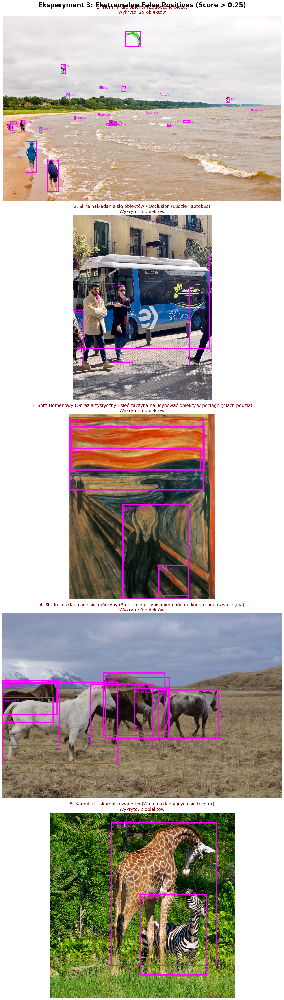

In [4]:
import urllib.request

extreme_cases = {
    "kite.jpg": (
        "https://raw.githubusercontent.com/pjreddie/darknet/master/data/kite.jpg", 
        "1. Tłum i małe obiekty (Zatłoczona plaża)"
    ),
    "bus_crowd.jpg": (
        "https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/bus.jpg", 
        "2. Silne nakładanie się obiektów / Occlusion (Ludzie i autobus)"
    ),
    "scream.jpg": (
        "https://raw.githubusercontent.com/pjreddie/darknet/master/data/scream.jpg", 
        "3. Shift Domenowy (Obraz artystyczny - sieć zaczyna halucynować obiekty w pociągnięciach pędzla)"
    ),
    "horses.jpg": (
        "https://raw.githubusercontent.com/pjreddie/darknet/master/data/horses.jpg", 
        "4. Stado i nakładające się kończyny (Problem z przypisaniem nóg do konkretnego zwierzęcia)"
    ),
    "giraffe.jpg": (
        "https://raw.githubusercontent.com/pjreddie/darknet/master/data/giraffe.jpg", 
        "5. Kamuflaż i skomplikowane tło (Wiele nakładających się tekstur)"
    )
}

model_base = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights=weights).to(device).eval()

fig, axes = plt.subplots(5, 1, figsize=(14, 45))
fig.suptitle("Eksperyment 3: Ekstremalne False Positives (Score > 0.25)", fontsize=20, fontweight="bold", y=0.99)

for i, (filename, (url, description)) in enumerate(extreme_cases.items()):
    img_path = os.path.join("data", filename)
    
    # Pobieranie
    if not os.path.exists(img_path):
        req = urllib.request.Request(url, headers={'User-Agent': 'Mozilla/5.0'})
        with urllib.request.urlopen(req) as response, open(img_path, 'wb') as out_file:
            out_file.write(response.read())

    # Przetwarzanie
    img_ext = read_image(img_path)
    img_ext_float = F.convert_image_dtype(img_ext, dtype=torch.float).to(device)

    # Predykcja
    with torch.no_grad():
        preds_ext = model_base([img_ext_float])[0]

    keep_ext = preds_ext["scores"] > 0.25
    boxes_ext = preds_ext["boxes"][keep_ext].cpu()
    scores_ext = preds_ext["scores"][keep_ext].cpu()
    labels_ext = [f"{weights.meta['categories'][l]} {s:.2f}" for l, s in zip(preds_ext["labels"][keep_ext].cpu(), scores_ext)]

    drawn_ext = draw_bounding_boxes(img_ext, boxes_ext, labels_ext, colors="magenta", width=3)

    axes[i].imshow(drawn_ext.permute(1, 2, 0))
    axes[i].set_title(f"{description}\nWykryto: {len(boxes_ext)} obiektów", fontsize=14, color="darkred")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Pobieranie i przygotowanie zbioru PennFudan do ewaluacji...
Analiza predykcji modelu i budowa macierzy pomyłek...


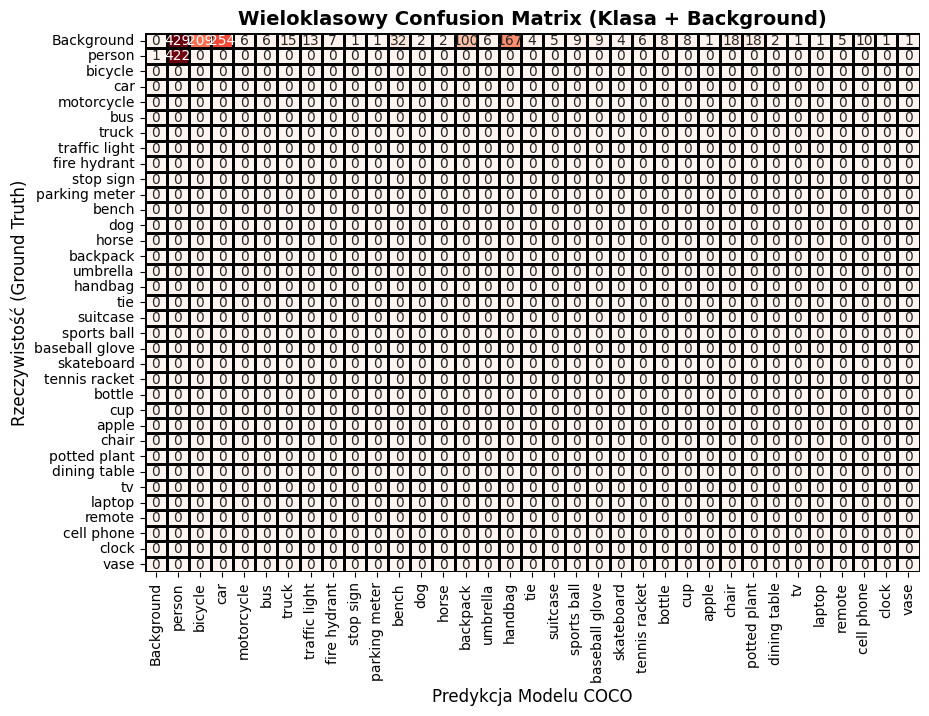

In [5]:
import torchvision.ops as ops
import seaborn as sns
import pandas as pd
from collections import defaultdict
import numpy as np

print("Pobieranie i przygotowanie zbioru PennFudan do ewaluacji...")
dataset_path = "data/PennFudanPed"
if not os.path.exists(dataset_path):
    urllib.request.urlretrieve("https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip", dataset_path + ".zip")
    import zipfile
    with zipfile.ZipFile(dataset_path + ".zip", 'r') as zip_ref:
        zip_ref.extractall('data')

class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = read_image(img_path)
        mask = read_image(mask_path)
        
        obj_ids = torch.unique(mask)[1:]
        masks = (mask == obj_ids[:, None, None]).to(dtype=torch.uint8)
        boxes = torchvision.ops.masks_to_boxes(masks)
        
        img = torchvision.tv_tensors.Image(img)
        target = {
            "boxes": torchvision.tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=img.shape[-2:]),
            "labels": torch.ones((len(obj_ids),), dtype=torch.int64),
        }
        if self.transforms is not None:
            img, target = self.transforms(img, target)
        return img, target

    def __len__(self): return len(self.imgs)

def get_transform(train):
    transforms = []
    if train: transforms.append(torchvision.transforms.v2.RandomHorizontalFlip(0.5))
    transforms.append(torchvision.transforms.v2.ToDtype(torch.float, scale=True))
    transforms.append(torchvision.transforms.v2.ToPureTensor())
    return torchvision.transforms.v2.Compose(transforms)

dataset_cm = PennFudanDataset('data/PennFudanPed', get_transform(train=False))
data_loader_cm = torch.utils.data.DataLoader(dataset_cm, batch_size=2, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

def compute_advanced_confusion_matrix(model, data_loader, device, iou_threshold=0.5, score_threshold=0.5):
    """Oblicza wieloklasową macierz pomyłek uwzględniającą klasę Background (0)"""
    cm_dict = defaultdict(int)
    
    with torch.no_grad():
        for images, targets in data_loader:
            images = [img.to(device) for img in images]
            outputs = model(images)
            
            for output, target in zip(outputs, targets):
                pred_boxes = output['boxes'].cpu()
                pred_scores = output['scores'].cpu()
                pred_labels = output['labels'].cpu().tolist()
                
                gt_boxes = target['boxes'].cpu()
                gt_labels = target['labels'].cpu().tolist()
                
                # Filtrujemy predykcje poniżej progu pewności
                keep = pred_scores > score_threshold
                pred_boxes = pred_boxes[keep]
                pred_labels = [l for i, l in enumerate(pred_labels) if keep[i]]
                
                # Scenariusz A: Brak Ground Truth, ale model coś widzi
                if len(gt_boxes) == 0:
                    for pl in pred_labels:
                        cm_dict[(0, pl)] += 1
                    continue
                    
                # Scenariusz B: Brak Predykcji, ale jest Ground Truth
                if len(pred_boxes) == 0:
                    for gl in gt_labels:
                        cm_dict[(gl, 0)] += 1 
                    continue
                    
                iou_matrix = torchvision.ops.box_iou(gt_boxes, pred_boxes)
                matched_preds = set()
                
                for gt_idx in range(len(gt_boxes)):
                    gl = gt_labels[gt_idx]
                    max_iou, pred_idx = iou_matrix[gt_idx].max(dim=0)
                    pred_idx = pred_idx.item()
                    
                    if max_iou > iou_threshold and pred_idx not in matched_preds:
                        pl = pred_labels[pred_idx]
                        cm_dict[(gl, pl)] += 1 # Prawidłowa klasyfikacja LUB Pomyłka klasy
                        matched_preds.add(pred_idx)
                    else:
                        cm_dict[(gl, 0)] += 1 # False Negative (Obiekt uznany za tło)
                        
                # Pozostałe predykcje, które nie dopasowały się do żadnego GT to False Positives z tła
                for pred_idx in range(len(pred_boxes)):
                    if pred_idx not in matched_preds:
                        pl = pred_labels[pred_idx]
                        cm_dict[(0, pl)] += 1 # False Positive (Tło uznane za obiekt)
                        
    return cm_dict

print("Analiza predykcji modelu i budowa macierzy pomyłek...")
cm_dict = compute_advanced_confusion_matrix(model_base, data_loader_cm, device)

# Przygotowanie etykiet do wykresu
categories = weights.meta["categories"]
categories[0] = "Background" # Mapowanie tła

# Zbieramy wszystkie unikalne klasy, które pojawiły się w Ground Truth lub Predykcjach
unique_classes = set([k[0] for k in cm_dict.keys()] + [k[1] for k in cm_dict.keys()])
sorted_classes = sorted(list(unique_classes))
class_names = [categories[i] if i < len(categories) else str(i) for i in sorted_classes]

# Budowa klasycznej macierzy
cm_matrix = np.zeros((len(sorted_classes), len(sorted_classes)), dtype=int)
for (gt, pred), count in cm_dict.items():
    i = sorted_classes.index(gt)
    j = sorted_classes.index(pred)
    cm_matrix[i, j] = count

# Generowanie czytelnego wykresu z użyciem Seaborn
df_cm = pd.DataFrame(cm_matrix, index=class_names, columns=class_names)
plt.figure(figsize=(10, 7))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="Reds", cbar=False, linewidths=1, linecolor='black')
plt.title("Wieloklasowy Confusion Matrix (Klasa + Background)", fontsize=14, fontweight="bold")
plt.xlabel("Predykcja Modelu COCO", fontsize=12)
plt.ylabel("Rzeczywistość (Ground Truth)", fontsize=12)
plt.show()

## Eksperyment 4: Porównanie Architektury i Szybkości - Faster R-CNN vs YOLOv8l (Large)

In [6]:
try:
    from ultralytics import YOLO
except ImportError:
    import subprocess
    subprocess.run(["pip", "install", "ultralytics", "pycocotools", "-q"])
    from ultralytics import YOLO

# Używamy wersji Large (~43.7 mln parametrów) do rzetelnego porównania z ResNet-50 (~41.5 mln)
model_yolo = YOLO('yolov8l.pt') 

_ = model_base([img_float]) # GPU Warmup FasterRCNN
_ = model_yolo("data/sample_dog.jpg", verbose=False) # GPU Warmup YOLO

# Test czasu: Faster R-CNN
start_rcnn = time.time()
with torch.no_grad():
    _ = model_base([img_float])
time_frcnn = (time.time() - start_rcnn) * 1000

# Test czasu: YOLOv8l
start_yolo = time.time()
_ = model_yolo("data/sample_dog.jpg", verbose=False)
time_yolo = (time.time() - start_yolo) * 1000

# Obliczanie parametrów
frcnn_params = sum(p.numel() for p in model_base.parameters())

print("--- PORÓWNANIE ARCHITEKTUR ---")
print(f"Parametry Faster R-CNN (ResNet-50): {frcnn_params / 1e6:.1f} M")
print(f"Parametry YOLOv8l (Large):          ~43.7 M")
print("-" * 30)
print(f"Faster R-CNN Inference Time: {time_frcnn:.2f} ms")
print(f"YOLOv8l Inference Time:      {time_yolo:.2f} ms")
print(f"Różnica: YOLO (architektura jednoetapowa) jest ~{time_frcnn/time_yolo:.1f}x szybsze mimo zbliżonej wielkości modelu.")

--- PORÓWNANIE ARCHITEKTUR ---
Parametry Faster R-CNN (ResNet-50): 41.8 M
Parametry YOLOv8l (Large):          ~43.7 M
------------------------------
Faster R-CNN Inference Time: 798.55 ms
YOLOv8l Inference Time:      363.97 ms
Różnica: YOLO (architektura jednoetapowa) jest ~2.2x szybsze mimo zbliżonej wielkości modelu.


## Eksperyment 5 (Rozszerzenie GPU): Fine-Tuning 
Zamiast trenować w trakcie prezentacji, ładujemy wagi `faster_rcnn_pennfudan.pth` wygenerowane wcześniej w notatniku *Demo*.

Pomyślnie wczytano wytrenowane wagi z dysku.


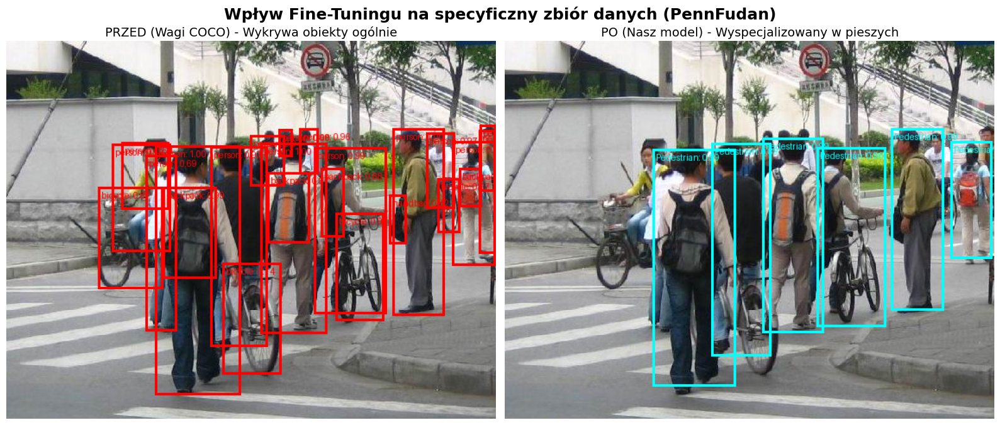

In [7]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.transforms import v2 as T

# Rekonstrukcja zmodyfikowanej architektury (2 klasy)
model_ft = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")
in_features = model_ft.roi_heads.box_predictor.cls_score.in_features
model_ft.roi_heads.box_predictor = FastRCNNPredictor(in_features, 2)
in_features_mask = model_ft.roi_heads.mask_predictor.conv5_mask.in_channels
model_ft.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, 256, 2)
model_ft.to(device)

weights_file = "faster_rcnn_pennfudan.pth"

if os.path.exists(weights_file):
    model_ft.load_state_dict(torch.load(weights_file, map_location=device, weights_only=True))
    print("Pomyślnie wczytano wytrenowane wagi z dysku.")
else:
    print("BŁĄD: Brak pliku z wagami. Uruchom najpierw sekcję trenowania z notatnika Demo!")

# Wizualizacja przed i po transfer learningu
model_ft.eval()
test_img = read_image("data/PennFudanPed/PNGImages/FudanPed00046.png")
test_tensor = T.ToPureTensor()(T.ToDtype(torch.float, scale=True)(test_img)).to(device)

# predykcja przed
with torch.no_grad():
    pred_base = model_base([test_tensor])[0]

keep_base = pred_base["scores"] > 0.6
boxes_base = pred_base["boxes"][keep_base].cpu()
labels_base = [f"{weights.meta['categories'][l]}: {s:.2f}" for l, s in zip(pred_base["labels"][keep_base].cpu(), pred_base["scores"][keep_base].cpu())]
res_img_base = draw_bounding_boxes(test_img, boxes_base, labels_base, colors="red", width=3)

# predykcja po
with torch.no_grad():
    pred_ft = model_ft([test_tensor])[0]

keep_ft = pred_ft["scores"] > 0.6
boxes_ft = pred_ft["boxes"][keep_ft].cpu()
labels_ft = [f"Pedestrian: {s:.2f}" for s in pred_ft["scores"][keep_ft].cpu()]
res_img_ft = draw_bounding_boxes(test_img, boxes_ft, labels_ft, colors="cyan", width=3)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
fig.suptitle("Wpływ Fine-Tuningu na specyficzny zbiór danych (PennFudan)", fontsize=18, fontweight='bold')

axes[0].imshow(res_img_base.permute(1, 2, 0))
axes[0].set_title("PRZED (Wagi COCO) - Wykrywa obiekty ogólnie", fontsize=14)
axes[0].axis("off")

axes[1].imshow(res_img_ft.permute(1, 2, 0))
axes[1].set_title("PO (Nasz model) - Wyspecjalizowany w pieszych", fontsize=14)
axes[1].axis("off")

plt.tight_layout()
plt.show()